<a href="https://colab.research.google.com/github/PreferredAI/tutorials/blob/master/unsupervised-learning/dimensionality_reduction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Unsupervised Learning: Dimensionality Reduction

This tutorial demonstrates the concept of unsupervised learning for dimensionality reduction. It covers Principle Component Analysis (PCA) and Autoencoder (AE) methods demonstrated on MNIST and CIFAR-10 datasets.

##1. Setup

In [0]:
!pip install --quiet tensorflow==2.1.0 scikit-learn imageio seaborn plotly

In [2]:
import os
import sys
import time
import glob

import numpy as np
import pandas as pd
import IPython
import imageio
import plotly
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.decomposition import PCA
import tensorflow as tf

print("System version: {}".format(sys.version))
print("TensorFlow version: {}".format(tf.__version__))

System version: 3.6.9 (default, Nov  7 2019, 10:44:02) 
[GCC 8.3.0]
TensorFlow version: 2.1.0


##2. Data Preparation

The [MNIST dataset](http://yann.lecun.com/exdb/mnist/) of handwritten digits has a training set of 60,000 images, and a test set of 10,000 images. Each MNIST image is a vector of 784 (28x28) integers, each of which is between 0-255 and represents the intensity of a pixel.

### Load dataset

In [3]:
(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.mnist.load_data()
print("Training size:", train_images.shape)
print("Test size:", test_images.shape)

train_images = train_images.reshape(-1, 784).astype('float32')
test_images = test_images.reshape(-1, 784).astype('float32')

# Normalizing the images to the range of [0., 1.]
train_images /= 255.
test_images /= 255.

Training size: (60000, 28, 28)
Test size: (10000, 28, 28)


### Let's show some images from training data

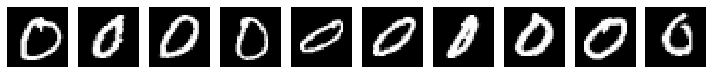

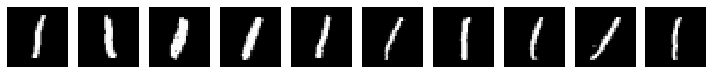

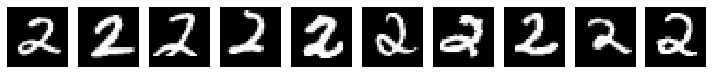

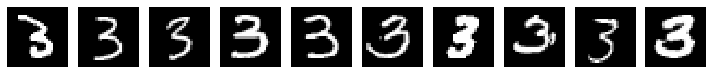

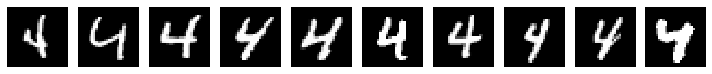

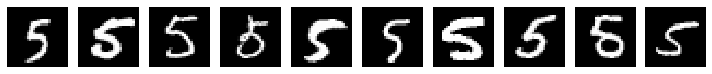

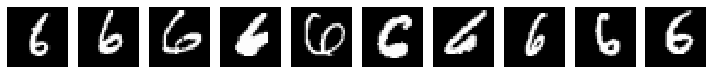

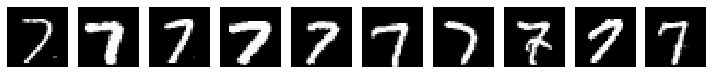

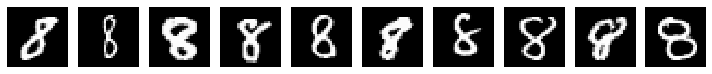

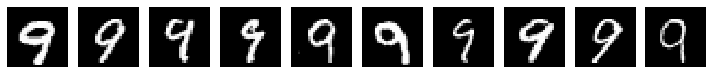

In [4]:
def save_and_show_images(images, fname, grayscale=True):
  np.clip(images, 0., 1., out=images)
  fig = plt.figure(figsize=(10, 1.2))
  for i in range(min(10, len(images))):
    plt.subplot(1, 10, i + 1)
    if grayscale:
      plt.imshow(images[i, :, :, 0], cmap="gray")
    else:
      plt.imshow(images[i])
    plt.axis("off")
  fig.tight_layout()
  plt.savefig(fname)
  plt.show()

for i in range(10):
  idx = np.where(train_labels == i)[0]
  selected_idx = np.random.choice(idx, 10, replace=False)
  display_images = train_images[selected_idx].reshape(-1, 28, 28, 1)
  save_and_show_images(display_images, "mnist_train_images_{}.png".format(i))

##3. Principal Component Analysis (PCA)

Test reconstruction error: 9.0034
Original images:


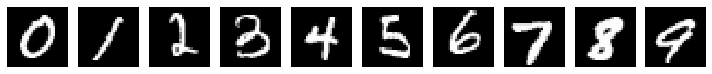

Reconstructed images:


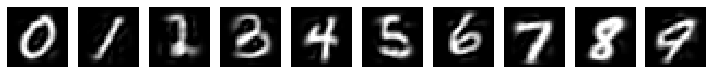

In [5]:
NUM_COMPONENTS = 50

# fitting
pca = PCA(n_components=NUM_COMPONENTS)
pca.fit(train_images)

# reconstruction error on the test set
test_projection = pca.transform(test_images)
test_reconstruction = pca.inverse_transform(test_projection)
reconstruction_error = np.square(test_images - test_reconstruction).sum(axis=1).mean()
print("Test reconstruction error: {:.4f}".format(reconstruction_error))

# anchor images for visualization and comparison
anchor_idx = []
for i in range(10):
  idx = np.where(train_labels == i)[0]
  anchor_idx.append(np.random.choice(idx))

print("Original images:")
save_and_show_images(train_images[anchor_idx].reshape(-1, 28, 28, 1), "mnist_anchor_images.png")

print("Reconstructed images:")
projected_images = pca.transform(train_images[anchor_idx])
reconstructed_images = pca.inverse_transform(projected_images)
save_and_show_images(reconstructed_images.reshape(-1, 28, 28, 1), "mnist_pca_images.png")

##4. Autoencoder

In [0]:
class Autoencoder(tf.keras.Model):
  def __init__(self, dims):
    super().__init__()
    self.dims = dims

    # encoder weights and biases
    print("Encoder:")
    self.W_e, self.b_e = [], []
    for l, (in_dim, out_dim) in enumerate(zip(dims[:-1], dims[1:])):
      print("Layer %d:" % (l + 1), (in_dim, out_dim))
      self.W_e.append(tf.Variable(tf.random.normal([in_dim, out_dim], stddev=0.01), name="W%d_e" % l))
      self.b_e.append(tf.Variable(tf.zeros(out_dim), name="b%d_e" % l))
    
    # decoder weights and biases
    print("Decoder:")
    self.W_d, self.b_d = [], []
    for l, (in_dim, out_dim) in enumerate(zip(dims[-1:0:-1], dims[-2::-1])):
      print("Layer %d:" % (l + 1), (in_dim, out_dim))
      self.W_d.append(tf.Variable(tf.random.normal([in_dim, out_dim], stddev=0.01), name="W%d_d" % l))
      self.b_d.append(tf.Variable(tf.zeros(out_dim), name="b%d_d" % l))

  def encode(self, x):
    h = x
    for W, b in zip(self.W_e, self.b_e):
      h = tf.matmul(h, W) + b
      h = tf.tanh(h)
    return h

  def decode(self, h):
    x_ = h
    for l, (W, b) in enumerate(zip(self.W_d, self.b_d)):
      x_ = tf.matmul(x_, W) + b
      x_ = tf.tanh(x_) if l < (len(self.W_d) - 1) else x_
    return x_
    
  def call(self, x):
    return self.decode(self.encode(x))

### Create AE model

Here we create an autoencoder with an architecture of [784, 50, 784]. In order to create a model, we only need to provide the dimentions of encoder, where the decoder is reversed as we assumne the architecture is symmetric.

In [7]:
mnist_ae = Autoencoder(dims=[784, 50])

Encoder:
Layer 1: (784, 50)
Decoder:
Layer 1: (50, 784)


### Define the loss function and the optimizer

We train our autoencoder by minizing the reconstruction error between our model predictions and the original images. The model weights will be optimized using Stochastic Gradient Descent.

In [0]:
def compute_loss(model, x):
  x_ = model(x)
  l2_loss = tf.square(x - x_)
  loss = tf.reduce_sum(l2_loss, axis=1)
  return tf.reduce_mean(loss)

def compute_apply_gradients(model, x, optimizer):
  with tf.GradientTape() as tape:
    loss = compute_loss(model, x)
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))

### Prepare data for training

We are going to train our model using TensorFlow framework. First, we need to build training and test datasets based on TF Dataset API.

In [0]:
BATCH_SIZE = 100

train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(train_images.shape[0]).batch(BATCH_SIZE)
test_dataset = tf.data.Dataset.from_tensor_slices(test_images).shuffle(test_images.shape[0]).batch(BATCH_SIZE)

### Training

The model will be trained for 20 epochs (1 epoch is 1 pass over all the training data).

Initial images:


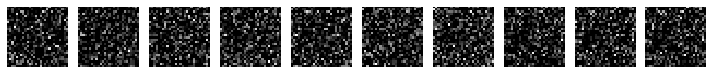

In [10]:
print("Initial images:")
decoded_images = mnist_ae(train_images[anchor_idx]).numpy()
save_and_show_images(decoded_images.reshape(-1, 28, 28, 1), "mnist_epoch_0000.png")

Epoch: 20, Test set loss: 9.6324, time elapse for current epoch 1.01s
Decoded images:


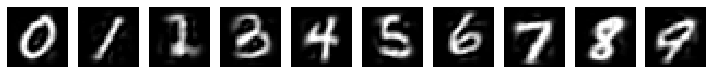

Original images:


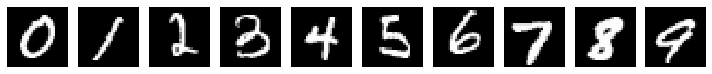

Reconstructed images from PCA earlier:


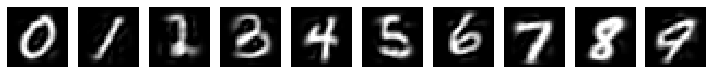

In [11]:
NUM_EPOCHS = 20

# create an optimizer for computing gradients and updating parameters
mnist_optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
# build static graph to speed up optimization
mnist_update = tf.function(compute_apply_gradients)

for epoch in range(1, NUM_EPOCHS + 1):
  tick = time.time()
  for train_x in train_dataset:
    mnist_update(mnist_ae, train_x, mnist_optimizer)
  tock = time.time()

  if epoch % 1 == 0:
    loss = tf.keras.metrics.Mean()
    for test_x in test_dataset:
      loss(compute_loss(mnist_ae, test_x))
    IPython.display.clear_output(wait=False)
    print("Epoch: {}, Test set loss: {:.4f}, "
          "time elapse for current epoch {:.2f}s".format(epoch,
                                                         loss.result(),
                                                         tock - tick))
    print("Decoded images:")
    decoded_images = mnist_ae(train_images[anchor_idx]).numpy()
    save_and_show_images(decoded_images.reshape(-1, 28, 28, 1), 
                         "mnist_epoch_{:04d}.png".format(epoch))

print("Original images:")
save_and_show_images(train_images[anchor_idx].reshape(-1, 28, 28, 1), "mnist_anchor_images.png")

print("Reconstructed images from PCA earlier:")
save_and_show_images(reconstructed_images.reshape(-1, 28, 28, 1), "mnist_pca_images.png")

Training progress animation:


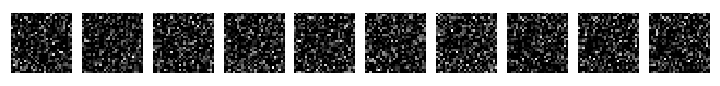

In [12]:
def display_anim(prefix, delay=1):
  gif_file = "{}.gif".format(prefix)

  with imageio.get_writer(gif_file, mode="I") as writer:
    filenames = glob.glob("{}_epoch_*.png".format(prefix))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
      frame = 2 * (i ** 0.6)
      if round(frame) > round(last):
        last = frame
      else:
        continue
      image = imageio.imread(filename)
      [writer.append_data(image) for _ in range(delay)]
    image = imageio.imread(filename)
    writer.append_data(image)

  print("Training progress animation:")
  with open(gif_file, 'rb') as f:
    display(IPython.display.Image(data=f.read(), format='png'))


display_anim(prefix="mnist", delay=5)

##5. Visualizing learned latent space

We would like to have some intuition on how the autoencoder preserves information in order to minimize the reconstruction error. One attempt is to analyse how the encoded data is organized in the latent space.


For each class, let's pick a subset of images from the test set (e.g., 200 images). We will use the learned autoencoder encoding the images into the latent space.

In [0]:
n = 200  # number of selected images per class

encoded_images = np.empty((n * 10, mnist_ae.dims[-1]), dtype=np.float32)
labels = np.empty(n * 10, dtype=np.int)

for i in range(10):
  idx = np.where(test_labels == i)[0]
  selected_idx = np.random.choice(idx, n, replace=False)
  encoded_images[i*n:(i+1)*n] = mnist_ae.encode(test_images[selected_idx]).numpy()
  labels[i*n:(i+1)*n] = i

In [0]:
pca = PCA(n_components=3)
projection = pca.fit_transform(encoded_images)
df = pd.DataFrame(data=projection, columns=["x", "y", "z"])
df["label"] = labels

### Encoded images in 2D

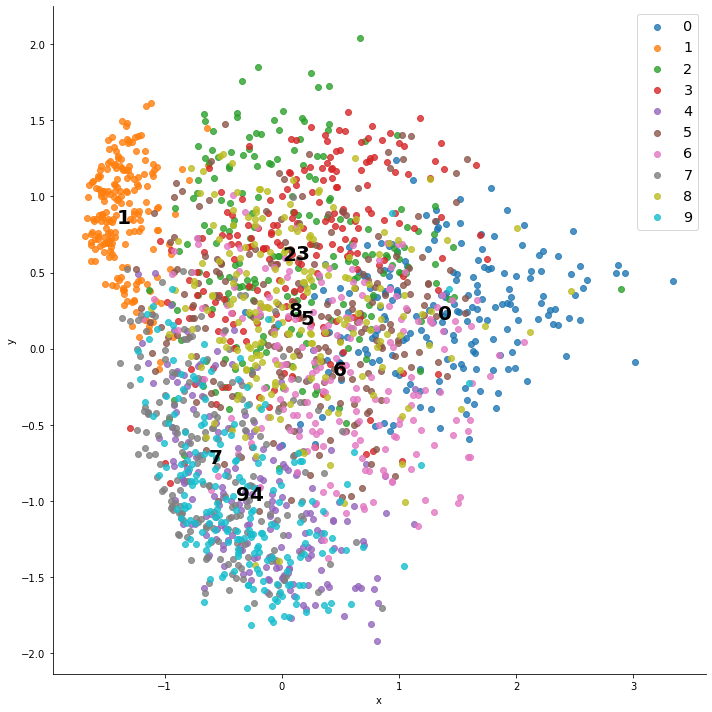

In [15]:
facet = sns.lmplot(data=df, x="x", y="y", hue="label", height=10.0, fit_reg=False, legend=False)
plt.legend(fontsize='x-large')

for label in range(10):
  plt.annotate(label,
               df.loc[df['label']==label,['x','y']].mean(),
               horizontalalignment='center',
               verticalalignment='center',
               size=20, weight='bold') 

### Encoded images in 3D 

In [16]:
colors = ["blue", "orange", "green", "red", "purple", "brown", "pink", "gray", "olive", "cyan"]
scatters = []
clusters = []
for i in range(10):
  cluster = df.loc[df["label"] == i]
  scatters.append(dict(mode="markers",
                       name="Class {}".format(i),
                       type="scatter3d",
                       x=cluster["x"], y=cluster["y"], z=cluster["z"],
                       marker=dict(size=2, color=colors[i])))
  clusters.append(dict(alphahull=5,
                       name="Class {}".format(i),
                       opacity=.1,
                       type="mesh3d",
                       x=cluster["x"], y=cluster["y"], z=cluster["z"],
                       color=colors[i], showscale=True))

layout = dict(title='MNIST Clustering Effect in 3D',
              legend=dict(x=0, y=1, font=dict(size=15), itemsizing="constant"),
              scene=dict(xaxis=dict(zeroline=True),
                         yaxis=dict(zeroline=True),
                         zaxis=dict(zeroline=True)))

fig = dict(data=scatters+clusters, layout=layout)
plotly.offline.iplot(fig, filename='mesh3d')

![alt text](https://static.preferred.ai/tutorials/3d.png)

##6. CIFAR-10 Dataset

The [CIFAR-10 dataset](https://www.cs.toronto.edu/~kriz/cifar.html) consists of 60000 32x32 colour images in 10 classes, with 6000 images per class. There are 50000 training images and 10000 test images.

### Load dataset

In [17]:
(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.cifar10.load_data()
print("Training size:", train_images.shape)
print("Test size:", test_images.shape)

train_images = train_images.reshape(-1, 3072).astype('float32')
test_images = test_images.reshape(-1, 3072).astype('float32')

# Normalizing the images to the range of [0., 1.]
train_images /= 255.
test_images /= 255.

A local file was found, but it seems to be incomplete or outdated because the auto file hash does not match the original value of 6d958be074577803d12ecdefd02955f39262c83c16fe9348329d7fe0b5c001ce so we will re-download the data.
170500096/170498071 [==============================] - 13s 0us/step
Training size: (50000, 32, 32, 3)
Test size: (10000, 32, 32, 3)


### Some images from training data

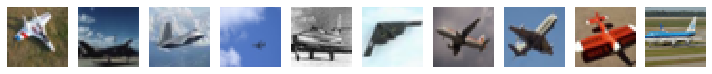

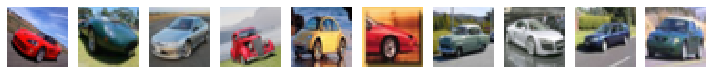

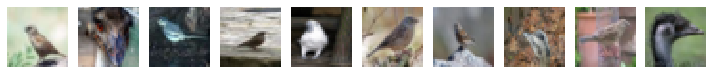

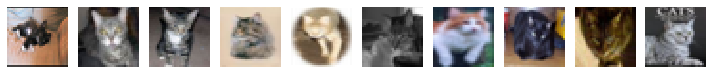

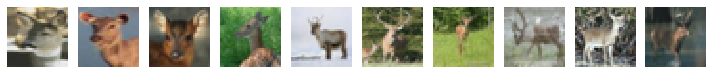

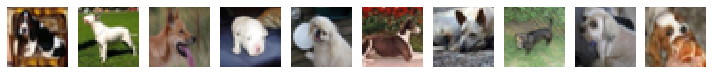

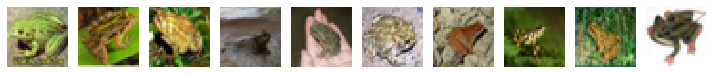

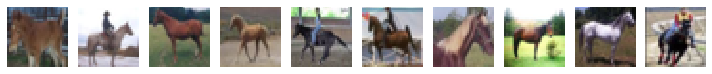

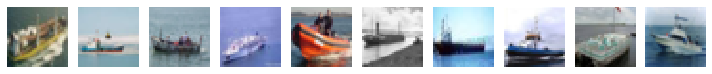

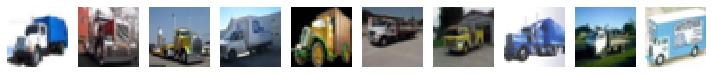

In [18]:
for i in range(10):
  idx = np.where(train_labels == i)[0]
  selected_idx = np.random.choice(idx, 10, replace=False)
  display_images = train_images[selected_idx].reshape(-1, 32, 32, 3)
  save_and_show_images(display_images, "cifar10_train_images_{}.png".format(i), False)

### Prepare data and model for training

In [19]:
# build TF datasets
BATCH_SIZE = 100
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(train_images.shape[0]).batch(BATCH_SIZE)
test_dataset = tf.data.Dataset.from_tensor_slices(test_images).shuffle(test_images.shape[0]).batch(BATCH_SIZE)

# build AE model for CIFAR10 data
cifar10_ae = Autoencoder(dims=[3072, 1000, 300])

# create an optimizer for computing gradients and updating parameters
cifar10_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4)
# build static graph to speed up optimization
cifar10_update = tf.function(compute_apply_gradients)

Encoder:
Layer 1: (3072, 1000)
Layer 2: (1000, 300)
Decoder:
Layer 1: (300, 1000)
Layer 2: (1000, 3072)


### Training

Initial images:


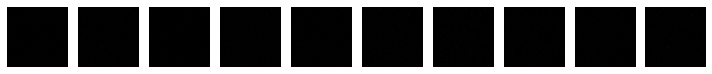

In [20]:
# keep archor images for visualization
anchor_idx = []
for i in range(10):
  idx = np.where(train_labels == i)[0]
  anchor_idx.append(np.random.choice(idx))

print("Initial images:")
decoded_images = cifar10_ae(train_images[anchor_idx]).numpy()
save_and_show_images(decoded_images.reshape(-1, 32, 32, 3), "cifar10_epoch_0000.png", False)

Epoch: 100, Test set loss: 8.4660, time elapse for current epoch 2.23s
Decoded images:


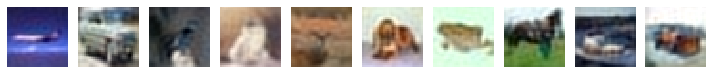

Original images:


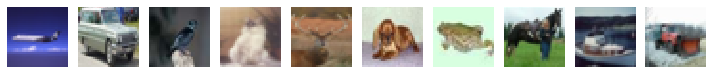

In [21]:
NUM_EPOCHS = 100

# start training
for epoch in range(1, NUM_EPOCHS + 1):
  tick = time.time()
  for train_x in train_dataset:
    cifar10_update(cifar10_ae, train_x, cifar10_optimizer)
  tock = time.time()

  if epoch % 1 == 0:
    loss = tf.keras.metrics.Mean()
    for test_x in test_dataset:
      loss(compute_loss(cifar10_ae, test_x))
    IPython.display.clear_output(wait=False)
    print("Epoch: {}, Test set loss: {:.4f}, "
          "time elapse for current epoch {:.2f}s".format(epoch,
                                                         loss.result(),
                                                         tock - tick))
    print("Decoded images:")
    decoded_images = cifar10_ae(train_images[anchor_idx]).numpy()
    save_and_show_images(decoded_images.reshape(-1, 32, 32, 3), 
                         "cifar10_epoch_{:04d}.png".format(epoch),
                         grayscale=False)
    
print("Original images:")
save_and_show_images(train_images[anchor_idx].reshape(-1, 32, 32, 3), "cifar10_anchor_images.png", False)

Training progress animation:


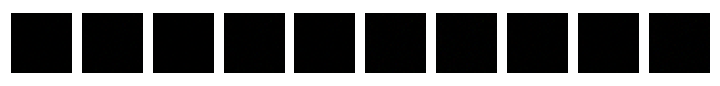

In [22]:
display_anim(prefix="cifar10", delay=5)

## Visualizing learned latent space in 2D using PCA

In [0]:
n = 200  # number of selected images per class
encoded_images = np.empty((n * 10, cifar10_ae.dims[-1]), dtype=np.float32)
labels = np.empty(n * 10, dtype=np.int)

for i in range(10):
  idx = np.where(test_labels == i)[0]
  selected_idx = np.random.choice(idx, n, replace=False)
  encoded_images[i*n:(i+1)*n] = cifar10_ae.encode(test_images[selected_idx]).numpy()
  labels[i*n:(i+1)*n] = i

In [0]:
pca = PCA(n_components=2)
projection = pca.fit_transform(encoded_images)

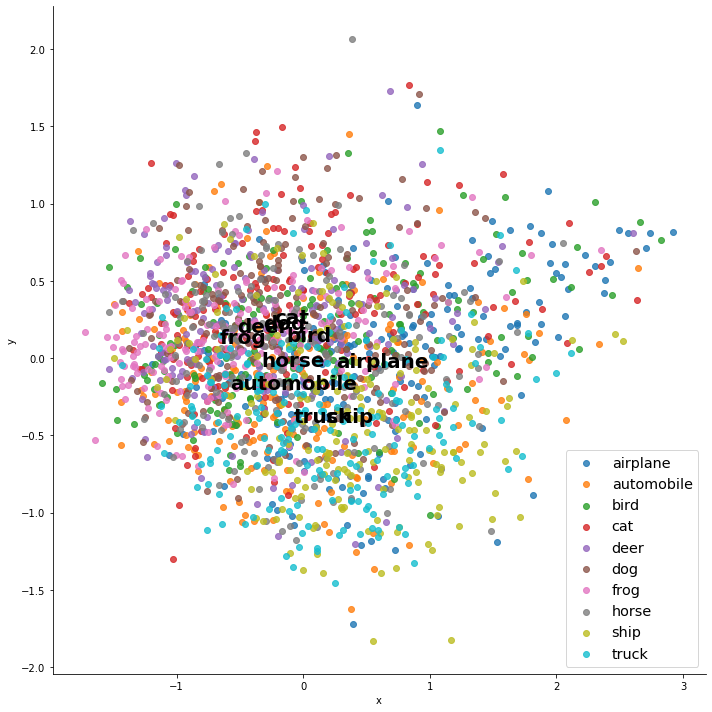

In [25]:
df = pd.DataFrame(data=projection, columns=["x", "y"])
df["label"] = labels
facet = sns.lmplot(data=df, x="x", y="y", hue="label", height=10.0, fit_reg=False, legend=False)

cls_names = ["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"]
for i in range(10):
  plt.annotate(cls_names[i],
               df.loc[df['label']==i,['x','y']].mean(),
               horizontalalignment='center',
               verticalalignment='center',
               size=20, weight='bold')

legend = plt.legend(fontsize='x-large')
for name, text in zip(cls_names, legend.get_texts()):
  text.set_text(name)